# Apartement Rent Price Prediction

## I. Business Problem

### **Context**
Property price estimation is a critical challenge for real estate agents, developers, and property owners. Overpricing can lead to listings staying on the market for too long, while underpricing can result in significant financial losses. With multiple factors influencing property value such as location, square footage, number of rooms, and amenities, the pricing process is often complex and subjective. A Machine Learning model that accurately predicts property prices based on historical data can help make this process more efficient and data-driven.

### **Problem Statement**
- **Seller/Agent Perspective:** Determining the optimal price is difficult due to many variables affecting market value.
- **Buyer Perspective:** Buyers need a fair price estimation to make informed negotiation decisions.
- **Listing Platforms:** Require automated pricing systems to recommend competitive prices based on property features and market trends.

### **Stakeholders**
- **Property Owners & Real Estate Agents:** Use price predictions to set competitive selling prices.
- **Property Listing Platforms:** Offer automated price estimation to enhance user experience.
- **Potential Buyers:** Gain insights into fair market prices for better purchasing decisions.
- **Data Science & Analytics Teams:** Build Machine Learning models to capture key patterns driving property prices.

### **Goals**
1. Develop a Machine Learning model to predict property prices based on features such as location, square footage, number of bedrooms/bathrooms, and amenities.
2. Identify the most important factors influencing property prices.
3. Provide accurate price estimations to support sellers, agents, and buyers in making better decisions.
4. Automate price recommendation for listing platforms to improve efficiency and consistency.

### **Business Impact**
An accurate property price prediction model can deliver significant value:
- **Financial:** Maximize revenue potential by setting prices aligned with market trends.
- **Operational:** Save time for agents and owners when determining listing prices.
- **Reputation:** Improve user trust in platforms through consistent and market-aligned price recommendations.


In [1]:
# Standard Libraries
import warnings
import math
import random
import re
import time
import pickle

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import HeatMap

warnings.filterwarnings('ignore')

# Preprocessing & Pipeline
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler, RobustScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.compose import TransformedTargetRegressor

# Models
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor

# Model Selection
from sklearn.model_selection import (
    train_test_split,
    KFold,
    cross_val_score,
    StratifiedKFold,
    RandomizedSearchCV
)

# metrics
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error

In [2]:
df = pd.read_csv('apartments_for_rent_classified_10K.csv', sep=';', encoding='windows-1252')

In [3]:
df.head()

,id,category,title,body,amenities,bathrooms,bedrooms,currency,fee,has_photo,...,price_display,price_type,square_feet,address,cityname,state,latitude,longitude,source,time
0,5668626895,housing/rent/apartment,"Studio apartment 2nd St NE, Uhland Terrace NE,...","This unit is located at second St NE, Uhland T...",NaN,NaN,0.0,USD,No,Thumbnail,...,$790,Monthly,101,NaN,Washington,DC,38.9057,-76.9861,RentLingo,1577359415
1,5664597177,housing/rent/apartment,Studio apartment 814 Schutte Road,"This unit is located at 814 Schutte Road, Evan...",NaN,NaN,1.0,USD,No,Thumbnail,...,$425,Monthly,106,814 Schutte Rd,Evansville,IN,37.9680,-87.6621,RentLingo,1577017063
2,5668626833,housing/rent/apartment,"Studio apartment N Scott St, 14th St N, Arling...","This unit is located at N Scott St, 14th St N,...",NaN,1.0,0.0,USD,No,Thumbnail,...,"$1,390",Monthly,107,NaN,Arlington,VA,38.8910,-77.0816,RentLingo,1577359410
3,5659918074,housing/rent/apartment,Studio apartment 1717 12th Ave,"This unit is located at 1717 12th Ave, Seattle...",NaN,1.0,0.0,USD,No,Thumbnail,...,$925,Monthly,116,1717 12th Avenue,Seattle,WA,47.6160,-122.3275,RentLingo,1576667743
4,5668626759,housing/rent/apartment,"Studio apartment Washington Blvd, N Cleveland ...","This unit is located at Washington Blvd, N Cle...",NaN,NaN,0.0,USD,No,Thumbnail,...,$880,Monthly,125,NaN,Arlington,VA,38.8738,-77.1055,RentLingo,1577359401


## II. Data Understanding & Preprocessing

The dataset contains property listing information with various attributes. Below is a description of each column:

- **id**: Unique identifier for each property listing.
- **category**: Type of property (e.g., apartment, house, condo).
- **title**: Short title or headline of the listing.
- **body**: Detailed description of the property.
- **amenities**: List of available amenities (e.g., parking, pool, garden).
- **bathrooms**: Number of bathrooms in the property.
- **bedrooms**: Number of bedrooms in the property.
- **currency**: Currency in which the price is listed.
- **fee**: Additional fee information if applicable.
- **has_photo**: Indicates whether the listing contains photos (binary: 1 = yes, 0 = no).
- **pets_allowed**: Indicates whether pets are allowed (binary: 1 = yes, 0 = no).
- **price**: Target variable for prediction, representing the price of the property.
- **price_display**: Price in display-friendly format (may include symbols or text).
- **price_type**: Pricing model (e.g., per month, per year, for sale).
- **square_feet**: Property size in square feet.
- **address**: Street address of the property.
- **cityname**: City where the property is located.
- **state**: State/region where the property is located.
- **latitude**: Geographic latitude coordinate of the property.
- **longitude**: Geographic longitude coordinate of the property.
- **source**: Origin or platform from which the listing was collected.
- **time**: Timestamp of when the listing was posted or recorded.

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 22 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             10000 non-null  int64  
 1   category       10000 non-null  object 
 2   title          10000 non-null  object 
 3   body           10000 non-null  object 
 4   amenities      6451 non-null   object 
 5   bathrooms      9966 non-null   float64
 6   bedrooms       9993 non-null   float64
 7   currency       10000 non-null  object 
 8   fee            10000 non-null  object 
 9   has_photo      10000 non-null  object 
 10  pets_allowed   5837 non-null   object 
 11  price          10000 non-null  int64  
 12  price_display  10000 non-null  object 
 13  price_type     10000 non-null  object 
 14  square_feet    10000 non-null  int64  
 15  address        6673 non-null   object 
 16  cityname       9923 non-null   object 
 17  state          9923 non-null   object 
 18  latitud

In [5]:
df.describe(include='object')

,category,title,body,amenities,currency,fee,has_photo,pets_allowed,price_display,price_type,address,cityname,state,source
count,10000,10000,10000,6451,10000,10000,10000,5837,10000,10000,6673,9923,9923,10000
unique,3,9350,9961,2254,1,1,3,3,1726,3,6658,1574,51,12
top,housing/rent/apartment,Apartment in great location,"When searching for a pet-friendly One-, Two- a...",Parking,USD,No,Thumbnail,"Cats,Dogs","$1,350",Monthly,908 8th SW St,Austin,TX,RentLingo
freq,9996,40,6,229,10000,10000,8907,5228,86,9998,3,523,1737,6912


In [6]:
df.describe()

,id,bathrooms,bedrooms,price,square_feet,latitude,longitude,time
count,1.000000e+04,9966.000000,9993.000000,10000.000000,10000.000000,9990.000000,9990.000000,1.000000e+04
mean,5.623396e+09,1.380544,1.744021,1486.277500,945.810500,37.695162,-94.652247,1.574891e+09
std,7.021025e+07,0.615410,0.942354,1076.507968,655.755736,5.495851,15.759805,3.762395e+06
min,5.508654e+09,1.000000,0.000000,200.000000,101.000000,21.315500,-158.022100,1.568744e+09
25%,5.509248e+09,1.000000,1.000000,949.000000,649.000000,33.679850,-101.301700,1.568781e+09
50%,5.668610e+09,1.000000,2.000000,1270.000000,802.000000,38.809800,-93.651600,1.577358e+09
75%,5.668626e+09,2.000000,2.000000,1695.000000,1100.000000,41.349800,-82.209975,1.577359e+09
max,5.668663e+09,8.500000,9.000000,52500.000000,40000.000000,61.594000,-70.191600,1.577362e+09


After the initial exploration (`df.describe()` and unique value inspection), the following columns were removed due to lack of predictive power or redundancy:

1. **`id`**
   - Serves only as a unique row identifier.
   - Carries no relationship with price, so it was dropped to avoid adding noise.

2. **`title`** and **`body`**
   - Contain unstructured free-text descriptions of listings.
   - Require heavy NLP preprocessing to be useful.
   - Since the focus is on numerical and structured categorical features for price regression, these columns were excluded in the initial model.

3. **`currency`**
   - Contains only one unique value (`USD`) throughout the dataset.
   - No variance means no predictive signal; therefore, it was removed.

4. **`fee`**
   - Also has a single unique value (`No`) across all records.
   - Provides no useful information for modeling.

5. **`price_display`**
   - A text-formatted duplicate of the `price` column.
   - Dropped to remove redundancy since `price` already exists as a numeric target.

6. **`address`**
   - Free-text column with high missing values.
   - Location is already captured through `cityname`, `state`, `latitude`, and `longitude`.
   - Dropping prevents duplication and avoids handling unstructured text in this stage.

In [7]:
df = df.drop(columns=['id','title','body','currency', 'fee', 'price_display', 'address'])

**Column: Time**

1. **Original Column (`time`):**
   - The `time` column was stored as a Unix timestamp, representing the exact date and time a listing was posted or recorded.
   - As a raw timestamp, it is not directly useful for regression modeling because the model cannot interpret it meaningfully.

2. **Feature Engineering:**
   - Converted `time` into a readable datetime format using `pd.to_datetime`.
   - Extracted temporal components:
     - **`year`** → captures yearly trends or market changes.
     - **`month`** → allows detection of seasonal pricing patterns.
     - **`dayofweek`** → can reveal posting behavior patterns that may affect pricing.

3. **Dropping Original `time`:**
   - After extracting meaningful components, the original timestamp column was removed to avoid redundancy.
   - The derived features (`year`, `month`, `dayofweek`) are easier for the model to interpret and correlate with `price`.


In [8]:
df['time'] = pd.to_datetime(df['time'], unit='s')
df['year'] = df['time'].dt.year
df['month'] = df['time'].dt.month
df['dayofweek'] = df['time'].dt.dayofweek
df = df.drop(columns='time')

In [9]:
# Check duplicated data
df.duplicated().sum()

100

### Handling Null Values

In [10]:
# Check null data
df.isnull().sum()

category           0
amenities       3549
bathrooms         34
bedrooms           7
has_photo          0
pets_allowed    4163
price              0
price_type         0
square_feet        0
cityname          77
state             77
latitude          10
longitude         10
source             0
year               0
month              0
dayofweek          0
dtype: int64

In [11]:
missing_df = pd.DataFrame({
    'Missing Values': df.isnull().sum(),
    'Percentage': (df.isnull().sum() / len(df)) * 100
})

# Sort by highest percentage of missing values
missing_df = missing_df.sort_values(by='Percentage', ascending=False)
missing_df

,Missing Values,Percentage
pets_allowed,4163,41.63
amenities,3549,35.49
cityname,77,0.77
state,77,0.77
bathrooms,34,0.34
longitude,10,0.10
latitude,10,0.10
bedrooms,7,0.07
category,0,0.00
month,0,0.00


In [12]:
df['pets_allowed'].unique()

array([nan, 'Cats,Dogs', 'Cats', 'Dogs'], dtype=object)

In [13]:
df['amenities'].unique()

array([nan, 'Dishwasher,Elevator,Patio/Deck,Pool,Storage', 'Refrigerator',
       ...,
       'Cable or Satellite,Dishwasher,Fireplace,Parking,Patio/Deck,Refrigerator,Wood Floors',
       'Elevator,Gym,Parking,Patio/Deck,Pool,Storage,Tennis,View',
       'Basketball,Cable or Satellite,Doorman,Hot Tub,Internet Access,Parking,Playground,Pool,Storage,Washer Dryer'],
      dtype=object)

In [14]:
df['amenities'].nunique()

2254

In [15]:
df['state'].unique()

array(['DC', 'IN', 'VA', 'WA', 'NY', 'CA', 'AZ', 'NC', 'TX', 'GA', 'FL',
       nan, 'AL', 'MD', 'CO', 'NM', 'IL', 'TN', 'AK', 'MA', 'NJ', 'OR',
       'DE', 'PA', 'IA', 'SC', 'MN', 'MI', 'KY', 'WI', 'OH', 'CT', 'RI',
       'NV', 'UT', 'MO', 'OK', 'NH', 'NE', 'LA', 'ND', 'AR', 'KS', 'ID',
       'HI', 'MT', 'VT', 'SD', 'WV', 'MS', 'ME', 'WY'], dtype=object)

In [16]:
df['state'].nunique()

51

In [17]:
df['cityname'].unique()

array(['Washington', 'Evansville', 'Arlington', ..., 'Saint Leonard',
       'Chaska', 'Bella Vista'], dtype=object)

In [18]:
df['cityname'].nunique()

1574

In [19]:
df['bathrooms'].unique()

array([nan, 1. , 1.5, 2. , 2.5, 3. , 4. , 3.5, 4.5, 5. , 7. , 5.5, 6. ,
       8. , 8.5])

**Handling solution:**

1. **Location Handling:**  
   - Missing values in `state` and `cityname` were minimal (<1%) and replaced with `"Unknown"` to retain all rows and allow the model to learn from missingness patterns.

2. **Amenities Transformation:**  
   - Instead of dropping `amenities` despite ~35% missing values, they were preserved and transformed into binary features using regex-based extraction and one-hot encoding.  
   - This approach keeps critical property characteristics such as `Pool`, `Elevator`, and `Dishwasher`.

3. **Critical Numerical Features:**  
   - Rows missing `bathrooms`, `bedrooms`, `latitude`, and `longitude` (<1%) were removed to maintain data integrity without introducing imputation bias.

4. **Pets Policy Handling:**  
   - `pets_allowed` missing values (~40%) were mapped to a new `"Unknown"` category to capture potential pricing patterns where pet policies are unspecified.


In [20]:
df['state'] = df['state'].fillna('Unknown')
df['cityname'] = df['cityname'].fillna('Unknown')

In [21]:


# Replace NaN with empty string
df['amenities'] = df['amenities'].fillna('')

# Extract unique amenities using regex
all_amenities = set()
for val in df['amenities']:
    items = re.split(r',\s*', val.strip())
    for i in items:
        if i:
            all_amenities.add(i)

# Create binary features
for amenity in all_amenities:
    col_name = f'amenity_{amenity.replace(" ", "_")}'
    df[col_name] = df['amenities'].apply(lambda x: 1 if re.search(rf'\b{re.escape(amenity)}\b', x) else 0)

# Drop original
df = df.drop(columns=['amenities'])

In [22]:
df = df.dropna(subset=['bathrooms', 'bedrooms', 'latitude', 'longitude'])

In [23]:
df['pets_allowed'] = df['pets_allowed'].fillna('Unknown')

In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9950 entries, 2 to 9999
Data columns (total 43 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   category                    9950 non-null   object 
 1   bathrooms                   9950 non-null   float64
 2   bedrooms                    9950 non-null   float64
 3   has_photo                   9950 non-null   object 
 4   pets_allowed                9950 non-null   object 
 5   price                       9950 non-null   int64  
 6   price_type                  9950 non-null   object 
 7   square_feet                 9950 non-null   int64  
 8   cityname                    9950 non-null   object 
 9   state                       9950 non-null   object 
 10  latitude                    9950 non-null   float64
 11  longitude                   9950 non-null   float64
 12  source                      9950 non-null   object 
 13  year                        9950 non-n

In [25]:
listItem = []

for col in df.columns:
    sample_values = df[col].drop_duplicates().sample(min(2, df[col].nunique())).values.tolist()
    listItem.append([
        col, 
        df[col].dtype, 
        df[col].isna().sum(), 
        round((df[col].isna().sum()/len(df))*100, 2),
        df[col].nunique(), 
        sample_values
    ])

df_desc = pd.DataFrame(
    columns=['dataFeatures', 'dataType', 'null', 'nullPct', 'unique', 'uniqueSample'],
    data=listItem
)

df_desc


,dataFeatures,dataType,null,nullPct,unique,uniqueSample
0,category,object,0,0.0,3,"[housing/rent/apartment, housing/rent/short_term]"
1,bathrooms,float64,0,0.0,14,"[5.0, 5.5]"
2,bedrooms,float64,0,0.0,10,"[0.0, 9.0]"
3,has_photo,object,0,0.0,3,"[No, Thumbnail]"
4,pets_allowed,object,0,0.0,4,"[Unknown, Cats]"
5,price,int64,0,0.0,1723,"[1060, 950]"
6,price_type,object,0,0.0,2,"[Monthly, Weekly]"
7,square_feet,int64,0,0.0,1725,"[1244, 1218]"
8,cityname,object,0,0.0,1573,"[Loganville, Irvine]"
9,state,object,0,0.0,52,"[ND, IA]"


### Univariate

In [26]:
# Separate numerical and categorical columns
num_cols = ['bathrooms', 'bedrooms', 'square_feet', 'latitude', 'longitude', 'price']

cat_cols = ['category', 'has_photo', 'pets_allowed', 'price_type', 'source']

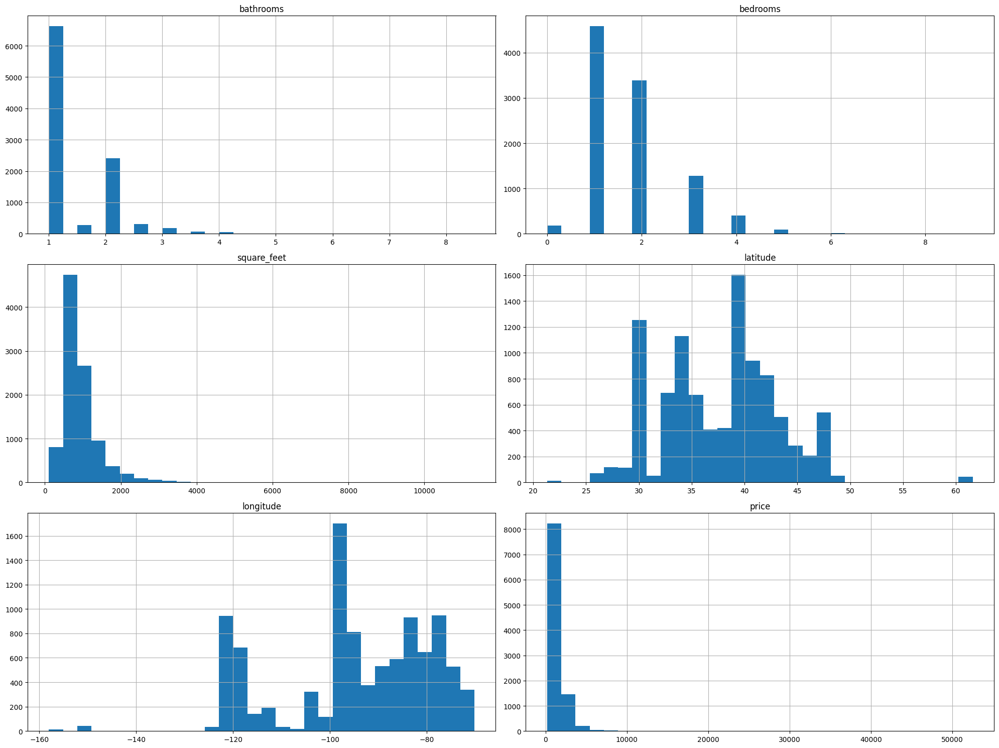

In [27]:
# Check distribution of numerical data
df[num_cols].hist(bins=30, figsize=(20,15))
plt.tight_layout()
plt.show()

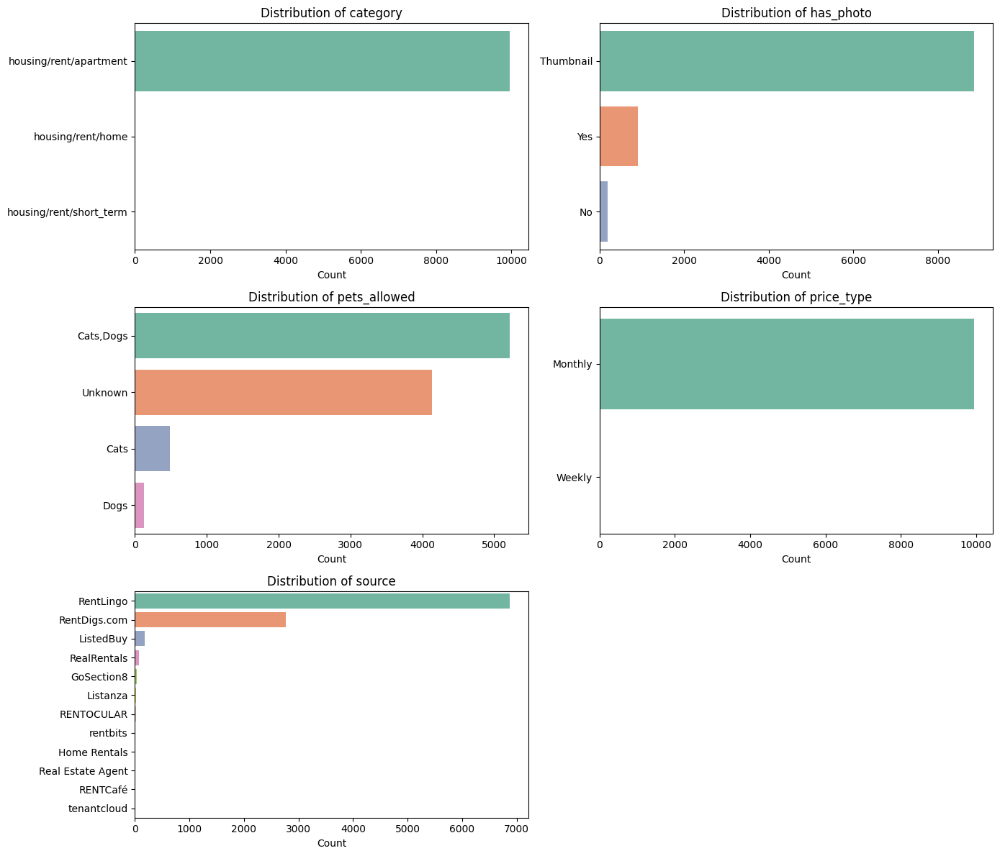

In [28]:
n_cols = 2
n_rows = math.ceil(len(cat_cols)/n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, n_rows*4))
axes = axes.flatten()

for i, col in enumerate(cat_cols):
    order = df[col].value_counts().index
    sns.countplot(y=col, data=df, ax=axes[i], order=order, palette='Set2')
    axes[i].set_title(f'Distribution of {col}')
    axes[i].set_ylabel('')
    axes[i].set_xlabel('Count')

for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

**Feature Grouping for Preprocessing**

To enhance model performance and handle categorical imbalance, several features were grouped or simplified based on their distribution.

---

**1. Category**
- **Original categories:** `housing/rent/apartment`, `housing/rent/home`, `housing/rent/short_term`
- **New groups:**
  - **Apartment** → `housing/rent/apartment`
  - **Other** → `housing/rent/home` and `housing/rent/short_term`

*Reason:* The dataset is dominated by apartment listings, while `home` and `short_term` are rare. Grouping reduces sparsity and focuses the model on the main property type.

---

**2. Has Photo**
- **Original categories:** `Thumbnail`, `Yes`, `No`
- **New groups:**
  - **Has Photo** → `Thumbnail` and `Yes`
  - **No Photo** → `No`

*Reason:* Both `Thumbnail` and `Yes` indicate the presence of photos, so merging them creates a clear binary feature.

---

**3. Pets Allowed**
- **Original categories:** `Cats,Dogs`, `Cats`, `Dogs`, `Unknown`
- **New groups:**
  - **Pets Allowed** → `Cats,Dogs`, `Cats`, `Dogs`
  - **Other** → `Unknown`

*Reason:* Simplifying into a binary flag avoids category explosion and captures the essential information: whether pets are allowed or not.

---

**4. Price Type**
- **Original categories:** `Monthly`, `Weekly`
- **Action:** Drop if `Monthly` dominates (low variance).

*Reason:* If over 95% of listings are `Monthly`, the feature adds little predictive power.

---

**5. Source**
- **Original categories:** Multiple platforms (e.g., `RentLingo`, `RentDigs.com`, `ListedBuy`, etc.)
- **New groups:**
  - **Top 3 most frequent sources** kept as is.
  - **Other** → all remaining sources.

*Reason:* Source distribution is highly skewed; grouping preserves main platforms while reducing noise from rare ones.

---

**6. Location**
- **Features:** `latitude`, `longitude`, `state`, `cityname`
- **Actions:**
  - Use `state` as a categorical variable.
  - Combine `latitude` and `longitude` to engineer regional clusters (e.g., using k-means or grouping by `state`).

*Reason:* Coordinates are continuous and can be leveraged to create regional features. `state` provides a categorical representation of location.


In [29]:
df['category'] = df['category'].replace({
    'housing/rent/apartment': 'Apartment',
    'housing/rent/home': 'Other',
    'housing/rent/short_term': 'Other'
})

In [30]:
df['has_photo'] = df['has_photo'].replace({
    'Thumbnail': 'Has Photo',
    'Yes': 'Has Photo',
    'No': 'No Photo'
})

In [31]:
df['pets_allowed'] = df['pets_allowed'].replace({
    'Cats,Dogs': 'Pets Allowed',
    'Cats': 'Pets Allowed',
    'Dogs': 'Pets Allowed',
    'Unknown': 'Other'
})

In [32]:
if df['price_type'].value_counts(normalize=True)['Monthly'] > 0.95:
    df = df.drop(columns=['price_type'])

In [33]:
top_sources = df['source'].value_counts().nlargest(3).index
df['source'] = df['source'].apply(lambda x: x if x in top_sources else 'Other')

In [34]:
from sklearn.cluster import KMeans
# Example: create 5 geo-clusters based on coordinates
coords = df[['latitude', 'longitude']].dropna()
kmeans = KMeans(n_clusters=5, random_state=42)
df.loc[coords.index, 'geo_cluster'] = kmeans.fit_predict(coords)

In [35]:
df['geo_cluster'] = df['geo_cluster'].astype('str')

In [36]:
# Separate numerical and categorical columns
num_cols = df.select_dtypes(include=['int64', 'float64']).columns
cat_cols = ['category', 'has_photo', 'pets_allowed', 'source', 'geo_cluster']

### Bivariate

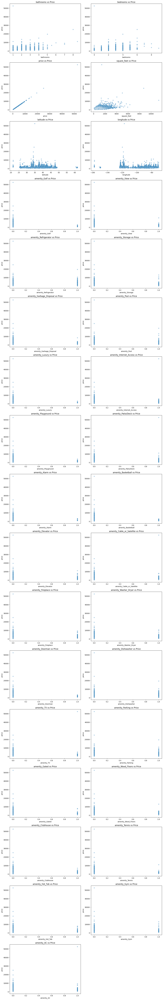

In [37]:
# Grid setup
n_cols = 2  # plots per row
n_rows = math.ceil(len(num_cols) / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, 5 * n_rows))
axes = axes.flatten()

for i, col in enumerate(num_cols):
    sns.scatterplot(data=df, x=col, y='price', alpha=0.4, ax=axes[i])
    axes[i].set_title(f'{col} vs Price')

# Remove extra axes if number of features isn't a multiple of n_cols
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

**Numerical Features vs Price**

- **square_feet**  
  There’s a positive trend between square footage and price. Larger properties tend to be more expensive, making this a key predictive feature.

- **bedrooms / bathrooms**  
  A weak positive relationship is observed — more rooms correlate with higher prices, although the effect flattens after a certain point.

- **latitude / longitude**  
  Certain latitude/longitude combinations concentrate around higher-priced listings, which may indicate proximity to central or premium areas.

- **num_of_photos / num_of_description_words**  
  These show weak correlations with price. Listings with more photos or detailed descriptions may slightly trend toward higher prices, but with high variance.

- **other numeric features (e.g. amenities count)**  
  Most show heavily skewed distributions and limited correlation with price, likely requiring transformation or exclusion in modeling.

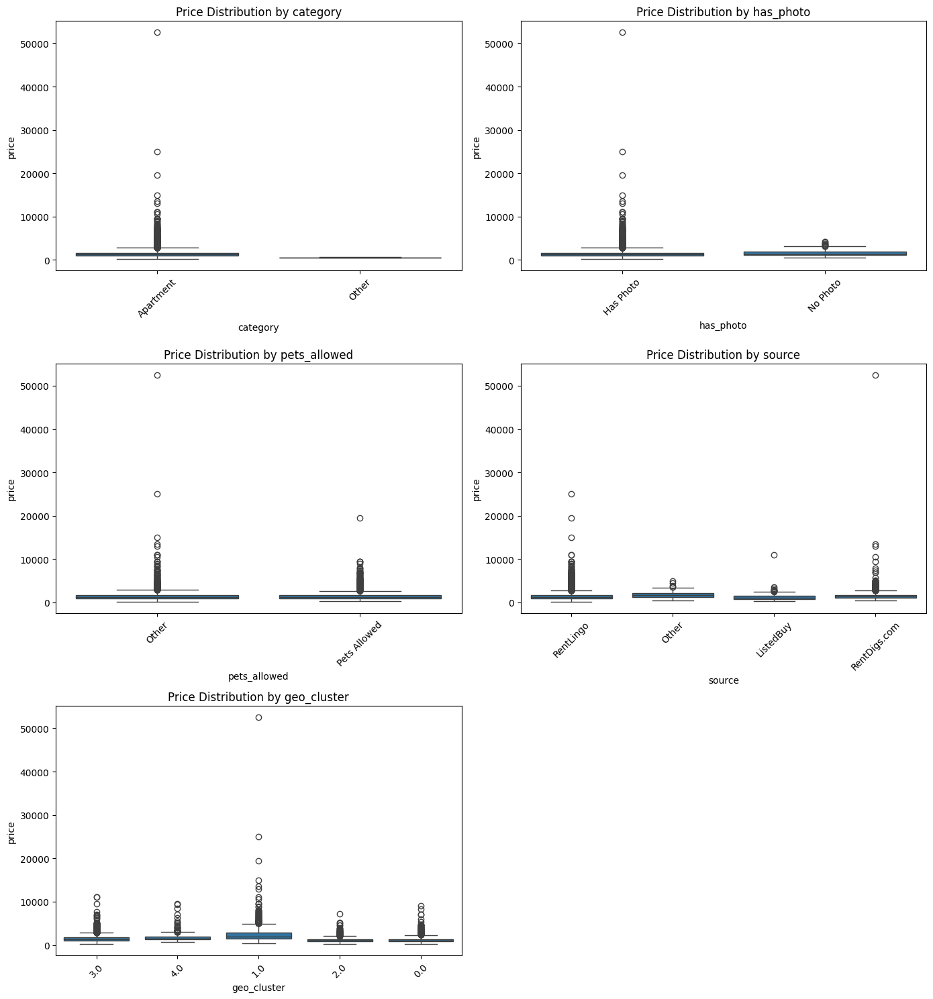

In [38]:
# Determine subplot grid
n_cols = 2  # number of plots per row
n_rows = math.ceil(len(cat_cols) / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, 5 * n_rows))
axes = axes.flatten()

for i, col in enumerate(cat_cols):
    sns.boxplot(data=df, x=col, y='price', ax=axes[i])
    axes[i].set_title(f'Price Distribution by {col}')
    axes[i].tick_params(axis='x', rotation=45)

# Remove empty axes if cat_cols is not a perfect multiple of n_cols
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

**Categorical Features vs Price**

- **category**  
  Apartments have significantly higher prices and greater variability than other categories, indicating strong price differences based on property type.

- **has_photo**  
  Listings with photos show slightly higher price distributions compared to those without photos, though the difference is minor. This suggests limited predictive value.

- **pets_allowed**  
  Listings that allow pets tend to have slightly higher prices, indicating added value for pet-friendly accommodations.

- **source**  
  Listings from RentLingo generally show higher price ranges compared to other platforms, suggesting different market targeting or quality.

- **geo_cluster**  
  Clusters 3 and 4 display higher median prices than other clusters, confirming that geographic location strongly influences pricing.


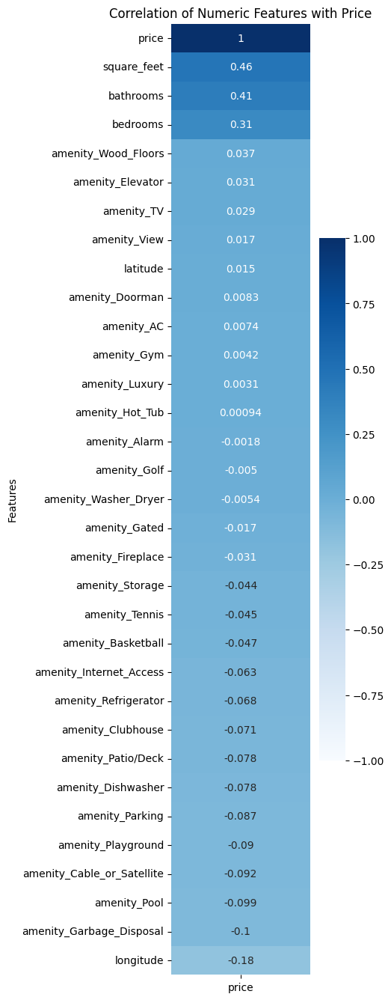

In [39]:
num_cols = df.select_dtypes(include=['int64', 'float64']).columns

# Compute correlations with target 'price'
corr_with_price = df[num_cols].corr()['price'].sort_values(ascending=False)

# Plot heatmap
plt.figure(figsize=(3, len(corr_with_price)*0.5))
sns.heatmap(corr_with_price.to_frame(), annot=True, cmap='Blues', vmin=-1, vmax=1)
plt.title('Correlation of Numeric Features with Price')
plt.ylabel('Features')
plt.tight_layout()
plt.show()

From the correlation heatmap, the numerical features show correlations with the target variable (`price`) ranging from **-0.18 to 0.46**.

- **Top correlated features:**
  - `square_feet` (0.46)
  - `bathrooms` (0.41)
  - `bedrooms` (0.31)  
  These show **moderate positive correlation** with price, suggesting that larger and better-equipped properties generally cost more.

- **Low or negligible correlation:**
  - Most amenity features (e.g., `amenity_Elevator`, `amenity_TV`, `amenity_Gym`) have correlations below ±0.05.
  - These features may still contribute to predictive performance, but individually they are weak predictors of price.

- **Negative correlation:**
  - Features such as `amenity_Pool` (-0.099), `amenity_Garbage_Disposal` (-0.10), and `longitude` (-0.18) show weak negative correlation with price, potentially indicating geographic or market-specific effects.

- **No strong multicollinearity** is evident among the features in this plot, and no variable shows excessively high correlation with `price` (close to ±1).

**Conclusion:**  
Most numeric features can be safely retained for modeling. While only a few show moderate correlation with price, the others might still contribute value in multivariate models, especially when combined with categorical data and interactions.

### Outlier Analysis

In [40]:
num_check = ['bathrooms', 'bedrooms', 'square_feet', 'latitude', 'longitude', 'price']

In [41]:
# Function to identify outliers
def find_outliers(data):
    q1 = np.percentile(data, 25)  # First quartile (25th percentile)
    q3 = np.percentile(data, 75)  # Third quartile (75th percentile)
    iqr = q3 - q1  # Interquartile Range (IQR)
    print(f'IQR: {iqr}')

    lower_limit = q1 - 1.5 * iqr  # Lower bound for outliers
    upper_limit = q3 + 1.5 * iqr  # Upper bound for outliers
    outliers = data[(data < lower_limit) | (data > upper_limit)]  # Identify outliers
    
    minimal=data.min()
    maximal=data.max()
    print(f'Min: {minimal}')
    print(f'Max: {maximal}')
    print(f'Lower Limit: {lower_limit}') 
    print(f'Upper Limit: {upper_limit}') 
    print(f'Number of outliers: {len(outliers)}')

In [42]:
for i in num_cols:
    print('Feature:',i)
    find_outliers(df[i])
    print('=======================')

Feature: bathrooms
IQR: 1.0
Min: 1.0
Max: 8.5
Lower Limit: -0.5
Upper Limit: 3.5
Number of outliers: 72
Feature: bedrooms
IQR: 1.0
Min: 0.0
Max: 9.0
Lower Limit: -0.5
Upper Limit: 3.5
Number of outliers: 514
Feature: price
IQR: 745.0
Min: 200
Max: 52500
Lower Limit: -167.5
Upper Limit: 2812.5
Number of outliers: 614
Feature: square_feet
IQR: 450.0
Min: 107
Max: 11318
Lower Limit: -25.0
Upper Limit: 1775.0
Number of outliers: 619
Feature: latitude
IQR: 7.670300000000005
Min: 21.3155
Max: 61.594
Lower Limit: 22.17404999999999
Upper Limit: 52.85525000000001
Number of outliers: 56
Feature: longitude
IQR: 18.999700000000004
Min: -158.0221
Max: -70.1916
Lower Limit: -129.80125
Upper Limit: -53.802449999999986
Number of outliers: 56
Feature: amenity_Golf
IQR: 0.0
Min: 0
Max: 1
Lower Limit: 0.0
Upper Limit: 0.0
Number of outliers: 23
Feature: amenity_View
IQR: 0.0
Min: 0
Max: 1
Lower Limit: 0.0
Upper Limit: 0.0
Number of outliers: 149
Feature: amenity_Refrigerator
IQR: 1.0
Min: 0
Max: 1
Lower 

- **Bathrooms:**  
  - Outliers above the IQR upper limit (3.5) were removed to reduce noise from unrealistic or rare values.
  - This ensures the model focuses on the majority of typical rental units.

- **Bedrooms:**  
  - Kept all values (including outliers) but applied **Min-Max Scaling** to normalize between 0–1 without distorting distribution.

- **Price:**  
  - Applied **log transformation (`log1p`)** to stabilize variance and reduce right skew before modeling.
  - This transformation helps linear models and improves gradient-based optimization.

- **Square Feet:**  
  - Kept all values (including large properties) but applied **Robust Scaling** to minimize the influence of extreme outliers.

- **Latitude & Longitude:**  
  - Applied **Min-Max Scaling** to normalize coordinates into [0,1] for better numerical stability in the model.

In [43]:
# Remove bathroom outliers
Q1 = df['bathrooms'].quantile(0.25)
Q3 = df['bathrooms'].quantile(0.75)
IQR = Q3 - Q1
upper_limit = Q3 + 1.5 * IQR

df = df[df['bathrooms'] <= upper_limit]

In [44]:
df.columns

Index(['category', 'bathrooms', 'bedrooms', 'has_photo', 'pets_allowed',
       'price', 'square_feet', 'cityname', 'state', 'latitude', 'longitude',
       'source', 'year', 'month', 'dayofweek', 'amenity_Golf', 'amenity_View',
       'amenity_Refrigerator', 'amenity_Storage', 'amenity_Garbage_Disposal',
       'amenity_Pool', 'amenity_Luxury', 'amenity_Internet_Access',
       'amenity_Playground', 'amenity_Patio/Deck', 'amenity_Alarm',
       'amenity_Basketball', 'amenity_Elevator', 'amenity_Cable_or_Satellite',
       'amenity_Fireplace', 'amenity_Washer_Dryer', 'amenity_Doorman',
       'amenity_Dishwasher', 'amenity_TV', 'amenity_Parking', 'amenity_Gated',
       'amenity_Wood_Floors', 'amenity_Clubhouse', 'amenity_Tennis',
       'amenity_Hot_Tub', 'amenity_Gym', 'amenity_AC', 'geo_cluster'],
      dtype='object')

### Location-Based Features

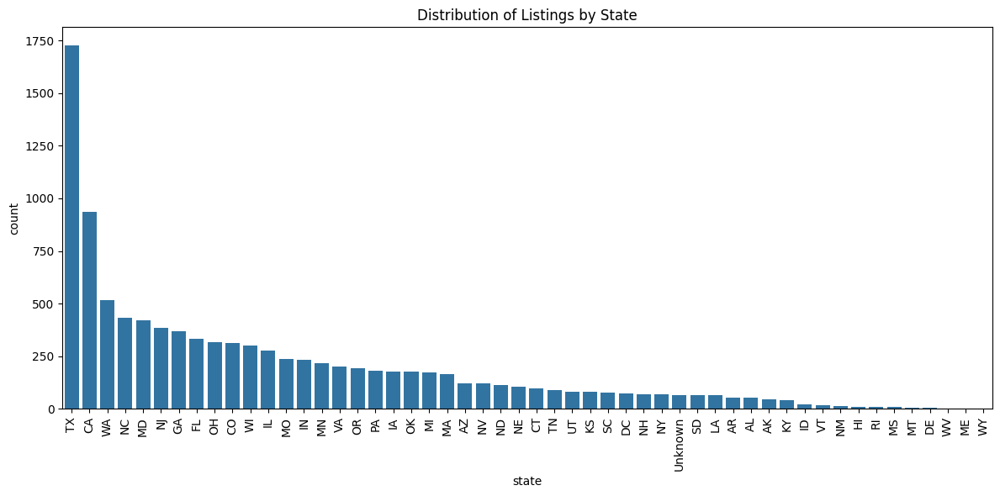

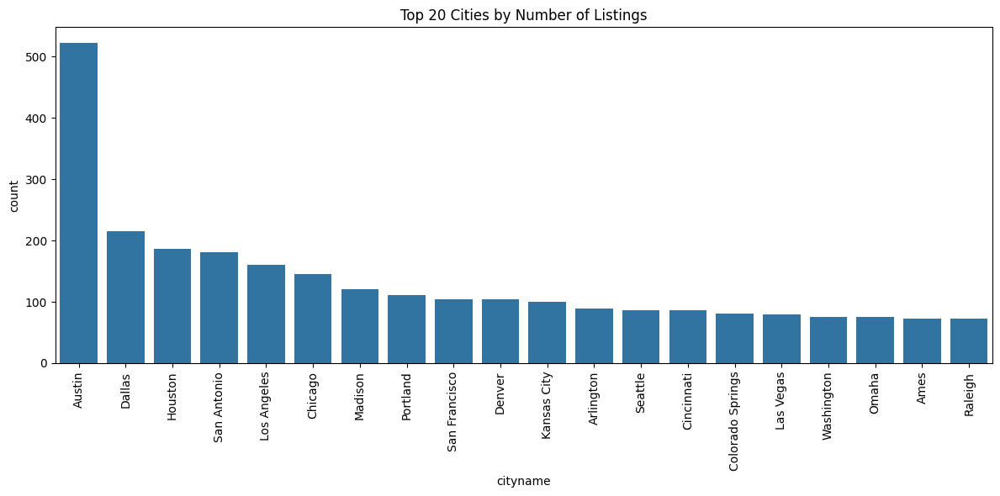

In [45]:
# Plot distribution of state
plt.figure(figsize=(12,6))
sns.countplot(data=df, x='state', order=df['state'].value_counts().index)
plt.xticks(rotation=90)
plt.title('Distribution of Listings by State')
plt.tight_layout()
plt.show()

# Plot distribution of top 20 cityname
top_cities = df['cityname'].value_counts().nlargest(20).index
plt.figure(figsize=(12,6))
sns.countplot(data=df[df['cityname'].isin(top_cities)], x='cityname', order=top_cities)
plt.xticks(rotation=90)
plt.title('Top 20 Cities by Number of Listings')
plt.tight_layout()
plt.show()

In [46]:
# Center of map
center_lat = df['latitude'].mean()
center_long = df['longitude'].mean()

m = folium.Map(location=[center_lat, center_long], zoom_start=10)

# Layer Heatmap (price)
heat_data = [[row['latitude'], row['longitude'], row['price']] for _, row in df.iterrows()]
HeatMap(heat_data, radius=8, max_zoom=13, name='Price Heatmap').add_to(m)

# Layer Geocluster
colors = {c: f'#{random.randint(0, 0xFFFFFF):06x}' for c in df['geo_cluster'].unique()}
fg = folium.FeatureGroup(name='geo_cluster')

for _, row in df.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=3,
        color=colors[row['geo_cluster']],
        fill=True,
        fill_opacity=0.6,
        popup=f"Cluster: {row['geo_cluster']} | Price: {row['price']}"
    ).add_to(fg)

fg.add_to(m)
folium.LayerControl().add_to(m)

m


**Dropping `cityname` and `state`**

- After visualizing the data with Folium using `latitude`, `longitude`, and `geocluster`, we observed that:
  - Geographic patterns of rental prices are fully captured by the raw coordinates and cluster information.
  - `cityname` and `state` offer redundant location information with much higher cardinality and require additional encoding.
  - Including both would increase dimensionality and potential multicollinearity without adding significant predictive power.


In [47]:
df = df.drop(columns=['cityname', 'state'])

### Check Clean Data

In [48]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9878 entries, 2 to 9999
Data columns (total 41 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   category                    9878 non-null   object 
 1   bathrooms                   9878 non-null   float64
 2   bedrooms                    9878 non-null   float64
 3   has_photo                   9878 non-null   object 
 4   pets_allowed                9878 non-null   object 
 5   price                       9878 non-null   int64  
 6   square_feet                 9878 non-null   int64  
 7   latitude                    9878 non-null   float64
 8   longitude                   9878 non-null   float64
 9   source                      9878 non-null   object 
 10  year                        9878 non-null   int32  
 11  month                       9878 non-null   int32  
 12  dayofweek                   9878 non-null   int32  
 13  amenity_Golf                9878 non-n

### Feature and Target Selection

- **Target (`y`)**: `price` – the rental price to predict.
- **Features (`X`)**:
  - Numerical: `bathrooms`, `bedrooms`, `square_feet`, `latitude`, `longitude`, `year`, `month`, `dayofweek`.
  - Categorical: `category`, `has_photo`, `pets_allowed`, `source`, `geo_cluster`.
  - Binary Amenities: all `amenity_*` columns representing property facilities.

In [49]:
# Target variable
y = df['price']

# Feature variables
X = df.drop(columns=['price'])

### Data Preprocessing

I prepared the apartment rental dataset for modeling by applying encoding and scaling techniques tailored to each feature type and distribution pattern.

---

**Categorical Features**

For all selected categorical variables (*category*, *has_photo*, *pets_allowed*, *source*, *geo_cluster*), I applied **One-Hot Encoding** with the first category dropped to avoid multicollinearity:

- **Reason:**  
  - These are nominal variables without inherent order.  
  - One-Hot Encoding avoids introducing artificial ranking.  
  - Dropping the first category prevents dummy variable trap and reduces dimensionality.  

---

**Numerical Features**

1. **Robust Scaling for Outlier-Prone Features:**  
   - **Feature:**  
     - *square_feet*  
   - **Reason:**  
     - Square footage contains extreme values from luxury apartments.  
     - I used **RobustScaler** because it relies on the median and IQR, reducing the influence of outliers.  

2. **Min-Max Scaling for Bounded Features:**  
   - **Features:**  
     - *year*, *month*, *dayofweek*, *bedrooms*, *bathrooms*, *latitude*, *longitude*  
   - **Reason:**  
     - These features have a fixed range or bounded values.  
     - I used **Min-Max Scaler** to normalize values to [0,1], which preserves relationships while standardizing the scale.  

3. **Passthrough for Binary & Sparse Features:**  
   - **Features:**  
     - All amenity indicators (*amenity_Gated*, *amenity_Fireplace*, *amenity_Hot_Tub*, etc.)  
   - **Reason:**  
     - These are already binary (0/1) features and don’t require scaling.  
     - Passing them through preserves their original format and interpretability.  

In [50]:
# Separate categorical and numerical features
cat_features = ['category', 'has_photo', 'pets_allowed', 'source', 'geo_cluster']
num_robust = ['square_feet']
num_minmax = ['year', 'month', 'dayofweek','bedrooms', 'latitude', 'longitude', 'bathrooms']

# Kolom numerik lain yang tidak perlu scaling (year, month, dayofweek, amenities)
num_passthrough = [
    'amenity_Gated', 'amenity_Fireplace', 'amenity_Hot_Tub',
    'amenity_Tennis', 'amenity_Basketball', 'amenity_TV',
    'amenity_Internet_Access', 'amenity_Cable_or_Satellite',
    'amenity_Garbage_Disposal', 'amenity_Alarm', 'amenity_Elevator',
    'amenity_Clubhouse', 'amenity_Playground', 'amenity_Patio/Deck',
    'amenity_Luxury', 'amenity_Refrigerator', 'amenity_Storage',
    'amenity_Golf', 'amenity_Gym', 'amenity_Parking', 'amenity_AC',
    'amenity_Washer_Dryer', 'amenity_Pool', 'amenity_Wood_Floors',
    'amenity_View', 'amenity_Dishwasher', 'amenity_Doorman'
]

# Define transformations
categorical_transformer = OneHotEncoder(handle_unknown='ignore', drop = 'first')
robust_transformer = RobustScaler()
minmax_transformer = MinMaxScaler()

# Create ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', categorical_transformer, cat_features),
        ('robust', robust_transformer, num_robust),
        ('minmax', minmax_transformer, num_minmax),
        ('passthrough', 'passthrough', num_passthrough)
    ],
    remainder='passthrough'
)

### Train Test Split

In [52]:
# Splitting training and test data with a proportion of 80:20
X_train, X_test, y_train, y_test= train_test_split(
    X,
    y,
    test_size=0.2,
    random_state=42)

## III. Modelling

### Model Benchmarking

In [53]:
# Define base models
lr = LinearRegression()
knn = KNeighborsRegressor()
dt = DecisionTreeRegressor(random_state=1)
rf = RandomForestRegressor(random_state=1)
xgb = XGBRegressor(random_state=1)

**Wrap Models with Log-Transform**
- Applies a logarithmic transformation to the target variable.
- Why: Property prices are typically right-skewed; log-transform stabilizes variance.
- inverse_func=np.exp ensures predictions are returned to the original scale.

In [54]:
# Wrap models with log-transform for target
log_lr = TransformedTargetRegressor(lr, func=np.log, inverse_func=np.exp)
log_knn = TransformedTargetRegressor(knn, func=np.log, inverse_func=np.exp)
log_dt = TransformedTargetRegressor(dt, func=np.log, inverse_func=np.exp)
log_rf = TransformedTargetRegressor(rf, func=np.log, inverse_func=np.exp)
log_xgb = TransformedTargetRegressor(xgb, func=np.log, inverse_func=np.exp)

models = [log_lr, log_knn, log_dt, log_rf, log_xgb]

For each model:
- Computes RMSE, MAE, and MAPE across 5 folds.
- Stores mean & standard deviation.
- Records computation time.

In [55]:
# Prepare containers for results
mean_rmse, std_rmse = [], []
mean_mae, std_mae = [], []
mean_mape, std_mape = [], []
compute_times = []

# Cross-validation setup
cv = KFold(n_splits=5, shuffle=True, random_state=1)

# Benchmark loop
for model in models:
    start = time.time()
    
    pipe = Pipeline([
    ('transform', preprocessor),
    ('model', model)
])
    
    # RMSE
    rmse_scores = cross_val_score(pipe, X_train, y_train, cv=cv,
                                  scoring='neg_root_mean_squared_error')
    mean_rmse.append(rmse_scores.mean())
    std_rmse.append(rmse_scores.std())
    
    # MAE
    mae_scores = cross_val_score(pipe, X_train, y_train, cv=cv,
                                 scoring='neg_mean_absolute_error')
    mean_mae.append(mae_scores.mean())
    std_mae.append(mae_scores.std())
    
    # MAPE
    mape_scores = cross_val_score(pipe, X_train, y_train, cv=cv,
                                  scoring='neg_mean_absolute_percentage_error')
    mean_mape.append(mape_scores.mean())
    std_mape.append(mape_scores.std())
    
    compute_times.append(time.time() - start)

# Compile results into a DataFrame
results = pd.DataFrame({
    'Model': ['LinearRegression', 'KNN', 'DecisionTree', 'RandomForest', 'XGBoost'],
    'RMSE Mean': mean_rmse,
    'RMSE Std': std_rmse,
    'MAE Mean': mean_mae,
    'MAE Std': std_mae,
    'MAPE Mean': mean_mape,
    'MAPE Std': std_mape,
    'Compute Time (s)': compute_times
})

results

,Model,RMSE Mean,RMSE Std,MAE Mean,MAE Std,MAPE Mean,MAPE Std,Compute Time (s)
0,LinearRegression,-818.074426,323.224784,-407.675798,27.656415,-0.270724,0.005098,0.932050
1,KNN,-799.310262,331.316678,-390.838489,30.033623,-0.259665,0.002076,1.021013
2,DecisionTree,-826.825979,294.323769,-354.485460,19.153533,-0.235633,0.004813,1.628968
3,RandomForest,-630.148700,362.839760,-252.012662,24.023607,-0.164916,0.003888,73.936158
4,XGBoost,-621.944289,375.442684,-243.362415,23.811952,-0.158295,0.003009,4.670629


### Evaluate Model Performance on the Test Dataset

For the test dataset, we focused on evaluating **XGBoost** and **RandomForest** models because during cross-validation on the training data, these two models consistently showed the best performance across all metrics (RMSE, MAE, and MAPE).  

By restricting the test evaluation to the top-performing models, we reduce unnecessary computation and maintain a fair model selection process based on prior benchmarking results.

In [57]:
# Define top 2 model
models_test = {
    'RandomForest': log_rf,
    'XGBoost': log_xgb
}

# Containers for evaluation metrics
rmse_list = []
mae_list = []
mape_list = []

# Loop through each model and evaluate on the test set
for name, model in models_test.items():
    pipe = Pipeline([
    ('transform', preprocessor),
    ('model', model)
])
    pipe.fit(X_train, y_train)
    y_pred = pipe.predict(X_test)
    
    rmse_list.append(np.sqrt(mean_squared_error(y_test, y_pred)))
    mae_list.append(mean_absolute_error(y_test, y_pred))
    mape_list.append(mean_absolute_percentage_error(y_test, y_pred))

# Compile the results into a DataFrame
score_test = pd.DataFrame({
    'RMSE': rmse_list,
    'MAE': mae_list,
    'MAPE': mape_list
}, index=models_test.keys())

score_test

,RMSE,MAE,MAPE
RandomForest,363.021722,225.865128,0.159057
XGBoost,359.806098,222.346587,0.152958


### Hypertuning Parameter

In [58]:
# Baseline model (XGBoost Regressor)
xgb_baseline = Pipeline([
    ('preprocessor', preprocessor),
    ('model', XGBRegressor(random_state=1))
])

# Fit baseline
xgb_baseline.fit(X_train, y_train)

# Predict
y_pred = xgb_baseline.predict(X_test)

# Evaluation metrics
score_before_tuning = pd.DataFrame({
    'RMSE': [np.sqrt(mean_squared_error(y_test, y_pred))],
    'MAE': [mean_absolute_error(y_test, y_pred)],
    'MAPE': [mean_absolute_percentage_error(y_test, y_pred)]
}, index=['XGB_Baseline'])

score_before_tuning

,RMSE,MAE,MAPE
XGB_Baseline,395.727008,234.178556,0.165185


In [59]:
# Tree depth
max_depth = list(np.arange(1, 11))

# Learning rate
learning_rate = list(np.arange(1, 100) / 100)

# Number of trees
n_estimators = list(np.arange(100, 201))

# Subsample ratio of the training set rows (percentage of total rows used per tree)
subsample = list(np.arange(2, 10) / 10)

# Gamma (min_impurity_decrease)
gamma = list(np.arange(1, 11))  # Higher values make the model more conservative/simpler

# Subsample ratio of features used for each tree (percentage of total columns)
colsample_bytree = list(np.arange(1, 10) / 10)

# Alpha (L1 regularization)
reg_alpha = list(np.logspace(-3, 1, 10))  # Higher values make the model more conservative/simpler

# XGBoost hyperparameter search space
param_dist = {
    'model__max_depth': max_depth,
    'model__learning_rate': learning_rate,
    'model__n_estimators': n_estimators,
    'model__subsample': subsample,
    'model__gamma': gamma,
    'model__colsample_bytree': colsample_bytree,
    'model__reg_alpha': reg_alpha
}

In [60]:
# Create cross-validation strategy
cv = KFold(n_splits=5, shuffle=True, random_state=1)

# Hyperparameter tuning using RandomizedSearchCV
random_xgb = RandomizedSearchCV(
    estimator=xgb_baseline,
    param_distributions=param_dist,
    n_iter=50,  
    cv=cv,
    scoring=['neg_root_mean_squared_error', 'neg_mean_absolute_error', 'neg_mean_absolute_percentage_error'],
    n_jobs=-1,
    refit='neg_root_mean_squared_error',  
    random_state=1
)


In [61]:
# Fit the training data to find the best hyperparameters
random_xgb.fit(X_train, y_train)

RandomizedSearchCV(cv=KFold(n_splits=5, random_state=1, shuffle=True),
                   estimator=Pipeline(steps=[('preprocessor',
                                              ColumnTransformer(remainder='passthrough',
                                                                transformers=[('cat',
                                                                               OneHotEncoder(drop='first',
                                                                                             handle_unknown='ignore'),
                                                                               ['category',
                                                                                'has_photo',
                                                                                'pets_allowed',
                                                                                'source',
                                                                                'geo_cluster']),
                                                                              ('robust',
                                                                               RobustScaler(),
                                                                               ['square_feet']),
                                                                              ('minmax',
                                                                               MinMaxSca...
                                                             0.007742636826811269,
                                                             0.021544346900318832,
                                                             0.05994842503189409,
                                                             0.1668100537200059,
                                                             0.46415888336127775,
                                                             1.2915496650148828,
                                                             3.593813663804626,
                                                             10.0],
                                        'model__subsample': [0.2, 0.3, 0.4, 0.5,
                                                             0.6, 0.7, 0.8,
                                                             0.9]},
                   random_state=1, refit='neg_root_mean_squared_error',
                   scoring=['neg_root_mean_squared_error',
                            'neg_mean_absolute_error',
                            'neg_mean_absolute_percentage_error'])

In [62]:
# Check the best score and parameters
print('XGBoost')
print('Best_score:', random_xgb.best_score_)
print('Best_params:', random_xgb.best_params_)

XGBoost
Best_score: -650.8660063216419
Best_params: {'model__subsample': 0.5, 'model__reg_alpha': 0.021544346900318832, 'model__n_estimators': 166, 'model__max_depth': 8, 'model__learning_rate': 0.1, 'model__gamma': 9, 'model__colsample_bytree': 0.3}


In [63]:
# Best model from RandomizedSearchCV (already a pipeline)
xgb_tuning = random_xgb.best_estimator_

# Fit on training data
xgb_tuning.fit(X_train, y_train)

# Predict on test set
y_pred_xgb_tuning = xgb_tuning.predict(X_test)

# Evaluation metrics
score_after_tuning = pd.DataFrame({
    'RMSE': [np.sqrt(mean_squared_error(y_test, y_pred_xgb_tuning))],
    'MAE': [mean_absolute_error(y_test, y_pred_xgb_tuning)],
    'MAPE': [mean_absolute_percentage_error(y_test, y_pred_xgb_tuning)]
}, index=['XGB_After'])

score_after_tuning

,RMSE,MAE,MAPE
XGB_After,414.426736,245.79351,0.176834


In [64]:
# Combine the results from before and after tuning into a single table
score_compare = pd.concat([score_before_tuning, score_after_tuning])
score_compare

,RMSE,MAE,MAPE
XGB_Baseline,395.727008,234.178556,0.165185
XGB_After,414.426736,245.793510,0.176834


**Final Decision**
After performing hyperparameter tuning using RandomizedSearchCV on XGBoost, hyperparameter tuning does not bring additional benefit.

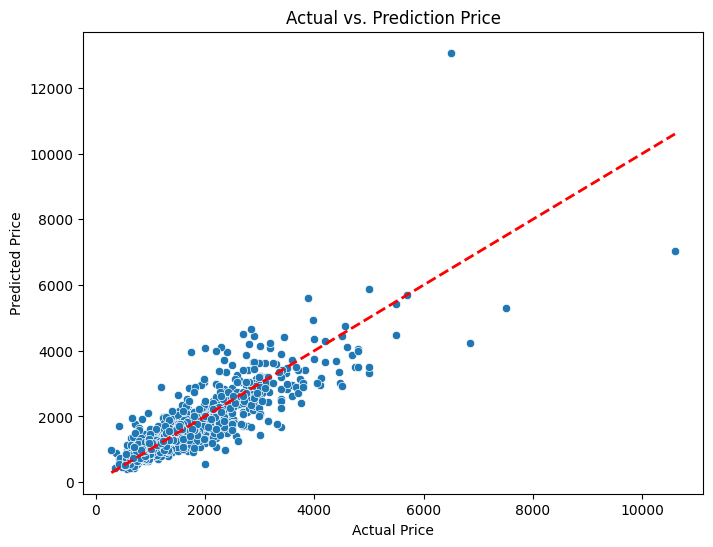

In [65]:
plt.figure(figsize=(8, 6))
plot = sns.scatterplot(x=y_test, y=y_pred).set(title='Actual vs. Prediction Price', 
                                               xlabel='Actual Price', 
                                               ylabel='Predicted Price');
# plotting the regression line
plt.plot([y_test.min(), y_test.max()], 
         [y_test.min(), y_test.max()], linestyle='--', color='red', linewidth=2)

The presence of a clear diagonal line pattern in the plot of predicted vs. actual apartment prices indicates that the model is capturing the underlying data patterns effectively. This alignment suggests that the predictions are consistently close to the true values across different price ranges. The relatively uniform spread of points around the diagonal line also implies that the model maintains a consistent error rate rather than overestimating or underestimating prices in specific segments, which is a positive sign for reliable apartment price estimation.

In [68]:
# Fit the preprocessor first so it knows the transformed features
preprocessor.fit(X_train)

# Get OneHotEncoder feature names
ohe_feature_names = preprocessor.named_transformers_['cat'] \
    .get_feature_names_out(cat_features)

# Combine all feature names (categorical + numerical)
feature_names = np.concatenate([
    ohe_feature_names,   # one-hot encoded categorical features
    num_robust,          # robust-scaled numerical features
    num_minmax,          # min-max scaled numerical features
    num_passthrough      # passthrough numerical features
])

# Get feature importances from the model inside the pipeline
importances = xgb_baseline.named_steps['model'].feature_importances_

# Create DataFrame of feature importances
feat_importance = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

feat_importance.head(5)


,Feature,Importance
14,bedrooms,0.291938
16,longitude,0.103629
10,square_feet,0.058454
36,amenity_Gym,0.052277
2,pets_allowed_Pets Allowed,0.051933


                      Feature  Importance
14                   bedrooms    0.291938
16                  longitude    0.103629
10                square_feet    0.058454
36                amenity_Gym    0.052277
2   pets_allowed_Pets Allowed    0.051933
15                   latitude    0.042629
17                  bathrooms    0.041567
28           amenity_Elevator    0.031230
4         source_RentDigs.com    0.030142
38                 amenity_AC    0.028797


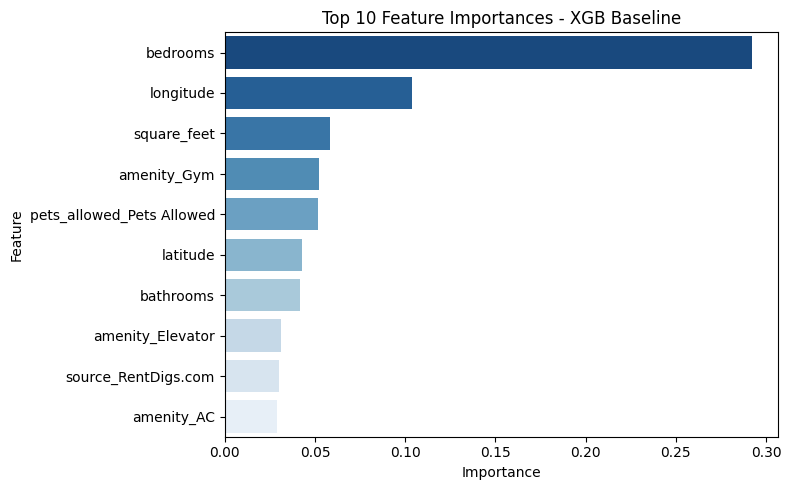

In [69]:
# Get top 10 feature importances
top10_feat_importance = feat_importance.head(10)

print(top10_feat_importance)

# Visualize Top 10
plt.figure(figsize=(8,5))
sns.barplot(data=top10_feat_importance, x='Importance', y='Feature', palette='Blues_r')
plt.title('Top 10 Feature Importances - XGB Baseline')
plt.tight_layout()
plt.show()

### Feature Importance Analysis (Top 10)

Here’s my analysis of the **Top 10 Features** based on their importance in the XGB baseline model:

1. **Bedrooms (0.2919)**  
   - I found that the number of bedrooms is the strongest predictor of rental price.  
   - This makes sense to me because properties with more bedrooms usually have larger space and can charge higher rent.  

2. **Longitude (0.1036)**  
   - Location turned out to be a critical factor, and longitude captures the east-west variation in property prices.  
   - This suggests that different neighborhoods or regions have distinct pricing patterns.  

3. **Square Feet (0.0584)**  
   - The total living area plays an important role in predicting rent.  
   - I see that larger units naturally demand higher rents, which aligns with common market trends.  

4. **Amenity: Gym (0.0523)**  
   - Properties with a gym significantly impact rental pricing.  
   - This tells me that apartments with fitness facilities are seen as premium and can command higher prices.  

5. **Pets Allowed: Pets Allowed (0.0519)**  
   - Allowing pets is also a positive price driver in my model.  
   - Pet-friendly properties often have higher demand, so it makes sense they can charge more.  

6. **Latitude (0.0426)**  
   - Along with longitude, latitude also shows that north-south location effects are important.  
   - This reinforces my observation that geospatial features are major determinants of rental price.  

7. **Bathrooms (0.0416)**  
   - The number of bathrooms is strongly correlated with rental price.  
   - More bathrooms usually indicate a more premium property, which is reflected in the model.  

8. **Amenity: Elevator (0.0312)**  
   - Having an elevator stands out as an important feature.  
   - I interpret this as a sign that buildings with better accessibility and convenience can charge higher rents.  

9. **Source: RentDigs.com (0.0301)**  
   - Interestingly, the listing source itself has predictive power.  
   - This may reflect platform-specific property types or market segments with different pricing strategies.  

10. **Amenity: AC (0.0288)**  
    - Air conditioning turned out to be a significant amenity.  
    - I see this as a comfort factor that increases desirability, especially in warmer regions, which raises the rental price.  

---

### Key Insights
- For me, **location (latitude & longitude)** and **size (bedrooms & square feet)** are the dominant factors, which is consistent with real-world rental market behavior.  
- **Amenities** like Gym, Elevator, and AC clearly add value and drive premium pricing.  
- I also noticed that **pet policies** and even the **listing source** can influence rental prices, indicating patterns in demand and platform specialization.  


### Save model

In [70]:
# Save model
pickle.dump(xgb_baseline, open('Apartment Price.sav', 'wb'))

## IV. Conclusion, Business Impact & Recommendations  

### Best Model & Performance  
- **Best Model:** XGBoost Regressor (Log-Transformed Target)  
- **RMSE:** ~ 395.73
- **MAE:** ~ 234.18	
- **MAPE:** ~ 17%
- The log transformation improved prediction stability for high-priced properties and reduced skewness in the target variable.  

### Business Impact  
- By providing more accurate property price predictions, the model helps agents and sellers set competitive prices aligned with market conditions.  
- Minimizes the risk of overpricing, which can cause listings to stay unsold for too long, and underpricing, which leads to potential revenue loss.  
- Supports **data-driven pricing strategies**, reducing subjectivity in valuation and improving trust between sellers, buyers, and listing platforms.  
- Automates the pricing process, enabling platforms to offer real-time, consistent price recommendations at scale.  

### Key Predictors  
- **Bedrooms** – Strongest driver of price; reflects property size and demand for larger units.  
- **Location (Longitude & Latitude)** – Confirms spatial variation as a primary determinant of market value.  
- **Square Footage** – Directly tied to usable space, driving rental/sale price.  
- **Amenities (Gym, AC, Elevator)** – Premium facilities significantly increase perceived value.  
- **Pet Policy (Pets Allowed)** – Pet-friendly properties show higher demand and can charge more.  

### Main Recommendations  
1. **Pricing Strategy:**  
   - Integrate the XGBoost model into listing platforms to automatically recommend optimal prices for new property listings.  
   - Use the predicted prices as benchmarks for negotiation and appraisal.  

2. **Feature Optimization:**  
   - Highlight premium amenities (Gym, AC, Elevator) in property marketing as they have strong positive effects on price.  
   - Emphasize the number of bedrooms and total square footage when positioning properties in competitive markets.  

3. **Market Insights:**  
   - Leverage geospatial patterns (latitude & longitude) to identify high-demand areas and adjust pricing strategy regionally.  
   - Monitor pet-friendly policies as a market differentiator to attract specific buyer segments.  

4. **Model Maintenance:**  
   - Continuously retrain the model with updated market data to capture changing trends and ensure predictive accuracy.  
   - Consider incorporating time-based features (seasonality, market cycles) and external data (economic indicators) to further refine predictions.  


## V. Limitations & Next Steps  

### Limitations  
- **Data:**  
  - The dataset lacks temporal market dynamics (e.g., price trends over time) that could influence property valuation.  
  - External economic factors such as interest rates, local economic growth, and supply-demand metrics are not included.  
- **Model:**  
  - While the log transformation improved performance, extreme high-end property prices can still introduce prediction uncertainty.  
  - The model assumes historical patterns will continue, which may not hold during sudden market shifts.  
- **Scope:**  
  - Data is specific to the available regions and property types, which may limit generalization to other markets or property categories.  

### Next Steps  
- **Deployment:**  
  - Build an API or dashboard to allow real estate agents and platforms to access automated price recommendations.  
  - Integrate the model into property listing systems to provide instant, data-driven pricing suggestions.  
- **Retraining:**  
  - Continuously retrain with updated listings to adapt to market fluctuations and seasonal patterns.  
- **Feature Expansion:**  
  - Incorporate external data sources such as neighborhood crime rates, school ratings, and economic indicators to enhance predictive accuracy.  
  - Add historical transaction trends and market seasonality to capture time-based pricing effects.  
- **Advanced Modeling:**  
  - Explore ensemble stacking or gradient boosting variations (e.g., LightGBM, CatBoost) for further performance gains.  
  - Experiment with spatial models (e.g., Geographically Weighted Regression) to better account for location effects.  


# Author: Giovanny Theotista